# Did We Really Desegregate?: Predicting School Zones with Demographic Data
## A model to determine how predictive demographic features are of elementary school zones

Charlottesville, Virginia, like every other town in the United States, has a checkered history with race relations and public education. The city school district has sought to remedy historic wrongs by updating its school zones and eliminating maps that were drawn to keep black kids out of historically white schools. This project looks at the current map and investigates the degree to which race still informs assigned school zone. Using census data about race, economic status, education levels, age spread, and details about housing, I was able to build a model that could predict a block's assigned school district with 82.7% accuracy. My model that relied only on racial makeup predicted the correct school only 31.6% of the time, hardly better than a dummy model.
 
![swings](images/aaron-burden-ob6O_xd67O0-unsplash.jpg)
Photo by <a href="https://unsplash.com/@aaronburden?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Aaron Burden</a> on <a href="https://unsplash.com/photos/ob6O_xd67O0?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Unsplash</a>
 
GitHub Repository: https://github.com/LydiaCuffman/cville_school_zones


## Business Understanding and Data Understanding
Charlottesville City Schools integrated under duress. Initially the superintendent closed the schools rather than integrate them. While the schools did eventually reopen and ostensibly integrated, what followed were decades of less overt segregation. <a href="https://www.nytimes.com/2018/10/16/us/charlottesville-riots-black-students-schools.html">The New York Times</a> reported on this history of discrimination against black students in a 2018 article. One illustrative example is Venable Elementary School, the school closest to the University of Virginia and the school cited in the article as having the highest test scores in the division. Students in a predominantly black neighborhood a half mile from the school were zoned for a school three miles away. That racist choice was only fully rectified in 2022, when the school board voted to adjust the school zoning map. The school division also issued an apology to community members for <a href="https://www.cvilletomorrow.org/after-half-a-century-bussing-kids-from-a-historically-black-public-housing-community-away-from-their-neighborhood-school-city-schools-votes-to-rezone-venable/">"historic and recent mistreatment."</a>

This project seeks to determine how equitable the new zoning map is. Now that an obviously racially motivated choice has been fixed, to what degree does the racial makeup of a neighborhood predict the elementary school its students are assigned to?

I used data from opendata.charlottesville.org as well as data collected by the Virginia Equity Center. Both data sets pull from the United States Census, but I found them easier to use than the direct Census Bureau portal. The Census breaks its data down on a variety of scales, with the smallest being Block. I overlaid the Charlottesville City Schools elementary school zone map with the Census blocks to build my data set. My racial data was at the Block level and my other demographic details were at the Block Group (one level up) level. My non-racial demographic data was largely focused on economic status, including features like median household income, percentage of population with health insurance, households receiving public health insurance and/or SNAP benefits, home-ownership rates, and the number of cost-burdened renters. Additionally I included the age breakdown of each Block Group along with details about number of housing units and how many of those units are vacant. 

In [1]:
import pandas as pd
import geopandas as gpd
import folium
import json
import xgboost
from folium.map import Popup, Tooltip
from folium.features import GeoJsonPopup, GeoJsonTooltip
from shapely.geometry import Polygon
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.dummy import DummyClassifier 
from sklearn.linear_model import LogisticRegressionCV
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier

In [2]:
#Load in a GeoJSON of Charlottesville census blocks
data = gpd.read_file('data/cville_census_blocks.geojson')

In [3]:
#Load in a GeoJSON of the elementary school zone boundaries
schools = gpd.read_file('data/cville_school_zones.geojson')
schools

,id,OBJECTID,ZONE,created_user,created_date,last_edited_user,last_edited_date,geometry
0,0,2,Clark,NaN,NaN,NaN,NaN,"POLYGON ((-78.47802 38.02863, -78.48150 38.029..."
1,1,4,Jackson-Via,NaN,NaN,NaN,NaN,"POLYGON ((-78.49029 38.02682, -78.49203 38.027..."
2,2,5,Johnson,NaN,NaN,NaN,NaN,"POLYGON ((-78.49289 38.02676, -78.49275 38.026..."
3,3,6,Greenbrier,NaN,NaN,NaN,NaN,"MULTIPOLYGON (((-78.47221 38.06803, -78.47100 ..."
4,4,1,Burnley-Moran,NaN,NaN,NaN,NaN,"POLYGON ((-78.49375 38.03334, -78.49380 38.033..."
5,5,3,Venable,NaN,NaN,NaN,NaN,"POLYGON ((-78.47841 38.04517, -78.47901 38.045..."


In [4]:
schools=schools.drop(columns=['created_user', 'created_date', 'last_edited_user', 'last_edited_date'], axis=1)

In [5]:
#Set variables for each school's boundaries
clark = schools['geometry'][0]
jv = schools['geometry'][1]
johnson = schools['geometry'][2]
greenbrier = schools['geometry'][3]
bm = schools['geometry'][4]
venable = schools['geometry'][5]

In [6]:
#Visualize the six school zones along with the census blocks
m = folium.Map(location=(38.034, -78.477), zoom_start=13)

folium.GeoJson(data,
    style_function=lambda feature: {
        'weight':1,
        "color": "blue",
        'fill_opacity':0
    },
).add_to(m)

popup = GeoJsonPopup(
    fields=['ZONE'],
    aliases=["School"],
    localize=True,
    labels=True,
    style="background-color: yellow;"
)

tooltip = GeoJsonTooltip(
    fields=['ZONE'],
    aliases=["Elementary Zone"],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800,
)


folium.GeoJson(schools, style_function = lambda x: {"fillColor": 'red' if x['properties']['ZONE']=="Clark" 
else ('blue' if x['properties']['ZONE']=="Jackson-Via" 
else ('orange' if x['properties']['ZONE']=="Johnson" 
else ('yellow' if x['properties']['ZONE']=="Burnley-Moran"
else ('purple' if x['properties']['ZONE']=="Greenbrier" else 'green')))), "weight": 4, 
                                                                         "color": "black", 'fill_opacity':1, 
                                                                         'fill':True}, popup=popup, tooltip=tooltip).add_to(m)



m

In [7]:
#Write a function that will label each block by its assigned school
def find_school_zone(schools, data):
    for x in range(803):
        if clark.contains(data['geometry'][x])==True:
            data['school_zone'][x]="Clark",
        elif jv.contains(data['geometry'][x])==True:
            data['school_zone'][x]="Jackson-Via",
        elif johnson.contains(data['geometry'][x])==True:
            data['school_zone'][x]="Johnson",
        elif greenbrier.contains(data['geometry'][x])==True:
            data['school_zone'][x]="Greenbrier",
        elif bm.contains(data['geometry'][x])==True:
            data['school_zone'][x]="Burnley-Moran",
        elif venable.contains(data['geometry'][x])==True:
            data['school_zone'][x]="Venable",
        else: data['school_zone'][x]="Manual"

In [8]:
#Make the new column, set a default
data['school_zone']="Manual"

In [9]:
#Run the function
pd.options.mode.chained_assignment = None
find_school_zone(schools, data)

In [10]:
#Check counts
data['school_zone'].value_counts()

Manual              196
(Venable,)          189
(Burnley-Moran,)    175
(Clark,)             78
(Greenbrier,)        66
(Jackson-Via,)       53
(Johnson,)           46
Name: school_zone, dtype: int64

In [11]:
#The function missed about 25% of zones, largely those on borders. Since the data set is rather small, I will
#refer to the visual map and input these school zones manually. In cases of a block that covers multiple attendance
#areas, I will assign to the school that has the clear majority of the zone. If a clear majority is not obvious,
#I will label it "Split".
manuals = data.loc[data['school_zone']=='Manual']

In [12]:
manuals

,id,OBJECTID,ID,cvgis.CITY.census_block_2010_area.AREA,Coloring,Block,BlockGroup,Tract,County,State,...,NH18__DOJ_Asn,NH18__DOJ_Hwn,NH18__DOJ_Oth,NH18__DOJ_OthMR,Housing_Units,HU_Occupied,HU_Vacant,Sliver,geometry,school_zone
0,0,1,11532,NaN,1,515400006002011,515400006002,51540000600,51540,51,...,150,0,0,5,156,148,8,0,"POLYGON ((-78.51184 38.02624, -78.51499 38.025...",Manual
2,2,3,11570,NaN,0,515400006002006,515400006002,51540000600,51540,51,...,0,0,0,0,2,2,0,0,"POLYGON ((-78.51974 38.02846, -78.51971 38.028...",Manual
4,4,5,11604,NaN,1,515400006002004,515400006002,51540000600,51540,51,...,58,0,0,1,0,0,0,0,"POLYGON ((-78.51939 38.02846, -78.51974 38.028...",Manual
5,5,6,11624,NaN,0,515400006002003,515400006002,51540000600,51540,51,...,11,0,0,0,19,17,2,0,"POLYGON ((-78.51650 38.02864, -78.51649 38.027...",Manual
6,6,7,11645,NaN,1,515400006002002,515400006002,51540000600,51540,51,...,198,1,0,3,178,173,5,0,"POLYGON ((-78.51447 38.02871, -78.51435 38.028...",Manual
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
793,793,794,21144,NaN,1,515400006001003,515400006001,51540000600,51540,51,...,0,0,0,0,0,0,0,0,"POLYGON ((-78.49868 38.03031, -78.49887 38.030...",Manual
796,796,797,21200,NaN,3,515400002022009,515400002022,51540000202,51540,51,...,0,0,0,0,0,0,0,0,"POLYGON ((-78.49735 38.03377, -78.49754 38.033...",Manual
797,797,798,21218,NaN,1,515400002021030,515400002021,51540000202,51540,51,...,0,0,0,0,0,0,0,0,"POLYGON ((-78.49651 38.03175, -78.49655 38.031...",Manual
798,798,799,21238,NaN,0,515400006001001,515400006001,51540000600,51540,51,...,0,0,0,0,0,0,0,0,"POLYGON ((-78.49539 38.03139, -78.49547 38.031...",Manual


In [14]:
#Inputs generated by creating an ArcGIS map of the two datasets, accessed through opendata.charlottesville.org
clark_blocks = [176, 177, 178, 206, 209, 212, 214, 502, 503, 505, 506, 508, 511, 552, 553, 554, 557, 569, 573, 716,
               717, 740, 745, 762, 768]
jv_blocks = [24, 27, 42, 49, 52, 62, 68, 70, 74, 158, 174, 179, 183, 193, 210, 497, 499]
johnson_blocks = [34, 40, 60, 65, 78, 83, 87, 166, 197, 198, 199, 202, 205, 779]
greenbrier_blocks = [129, 130, 225, 240, 246, 251, 253, 257, 286, 304, 306, 311, 312, 314, 315, 321, 362, 366, 368,
                    371, 372, 419, 421, 423, 425, 477, 482, 484, 485, 486, 487, 488, 490, 493, 494, 495, 622, 623,
                    627]
bm_blocks = [232, 233, 235, 236, 238, 239, 255, 256, 313, 390, 396, 398, 407, 408, 551, 571, 576, 618, 633, 710, 721,
            722, 723, 742, 744, 748, 750, 751, 769]
venable_blocks = [0, 2, 4, 5, 6, 7, 8, 9, 13, 17, 19, 20, 21, 77, 79, 99, 108, 110, 111, 113, 115, 116, 117, 123,
                 125, 126, 127, 131, 132, 133, 135, 345, 360, 369, 373, 377, 380, 384, 385, 386, 431, 709, 711, 752,
                 756, 782, 793, 796, 797, 798, 802]
split_blocks = [47, 84, 128, 169, 196, 258, 288, 290, 344, 441, 450, 470, 472, 476, 500, 501, 693, 707, 708, 713,
               715]

data['school_zone'][clark_blocks]='Clark'
data['school_zone'][jv_blocks]='Jackson-Via'
data['school_zone'][johnson_blocks]='Johnson'
data['school_zone'][greenbrier_blocks]='Greenbrier'
data['school_zone'][bm_blocks]='Burnley-Moran'
data['school_zone'][venable_blocks]='Venable'
data['school_zone'][split_blocks]='Split'


In [15]:
data['school_zone'].value_counts()

(Venable,)          189
(Burnley-Moran,)    175
(Clark,)             78
(Greenbrier,)        66
(Jackson-Via,)       53
Venable              51
(Johnson,)           46
Greenbrier           39
Burnley-Moran        29
Clark                25
Split                21
Jackson-Via          17
Johnson              14
Name: school_zone, dtype: int64

In [16]:
#The function inserted school names as tuples, so we need to standardize them
data['school_zone'] = data['school_zone'].apply(lambda x: x if type(x)==str else x[0])

In [17]:
data['school_zone'].value_counts()

Venable          240
Burnley-Moran    204
Greenbrier       105
Clark            103
Jackson-Via       70
Johnson           60
Split             21
Name: school_zone, dtype: int64

In [26]:
#The splits are not very helpful, so we'll drop those
data = data[data['school_zone'] != 'Split']

In [27]:
#Done with the shapes, so let's convert back to a standard dataframe
census = data.drop('geometry', axis=1)
census=pd.DataFrame(data)

In [29]:
#Look at the available information
census.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 782 entries, 0 to 802
Data columns (total 383 columns):
 #   Column                                  Dtype   
---  ------                                  -----   
 0   id                                      object  
 1   OBJECTID                                int64   
 2   ID                                      int64   
 3   cvgis.CITY.census_block_2010_area.AREA  float64 
 4   Coloring                                int64   
 5   Block                                   object  
 6   BlockGroup                              object  
 7   Tract                                   object  
 8   County                                  object  
 9   State                                   object  
 10  Block2000                               object  
 11  MCD                                     object  
 12  SubMCD                                  object  
 13  Place                                   object  
 14  ConCity                  

In [30]:
#Some of the information is irrelevant; some of it is the same for all rows; and some of it is repetitive.
#We will start with a selection of what seem like the most relevant features for our problem.
columns = ['BlockGroup', 'Population', 'White', 'Black', 'AmIndian', 'Asian', 'Hawaiian', 'Other', 
           'WhtBlk','Housing_Units', 'HU_Occupied', 'school_zone']
census = census[columns]

In [31]:
#Import additional information from the Virginia Equity Project. Most of this data was initially collected by the 
#U.S. Census. This data is only recorded at the block group level, so it is less granular than the first data set.
blocks = pd.read_csv('data/regional_atlas_block_groups.csv')
blocks

,Unnamed: 0,GEO_LEVEL,GEOID,STATEFP,COUNTYFP,COUNTYNS,NAME.x,NAMELSAD,LSAD,CLASSFP,...,locality,county.nice,TRACTCE,BLKGRPCE,blockgroup,count,tractnames,tract,tr,pop
0,1,Block Group,510030101001,51,3,NaN,NaN,Block Group 1,NaN,NaN,...,3,Albemarle County,10100,1,1,Albemarle,Free Union,10100,NaN,2101
1,2,Block Group,510030101002,51,3,NaN,NaN,Block Group 2,NaN,NaN,...,3,Albemarle County,10100,2,2,Albemarle,Free Union,10100,NaN,922
2,3,Block Group,510030101003,51,3,NaN,NaN,Block Group 3,NaN,NaN,...,3,Albemarle County,10100,3,3,Albemarle,Free Union,10100,NaN,1726
3,4,Block Group,510030102011,51,3,NaN,NaN,Block Group 1,NaN,NaN,...,3,Albemarle County,10201,1,1,Albemarle,Charlottesville-Albemarle Airport,10201,NaN,2218
4,5,Block Group,510030102012,51,3,NaN,NaN,Block Group 2,NaN,NaN,...,3,Albemarle County,10201,2,2,Albemarle,Charlottesville-Albemarle Airport,10201,NaN,1916
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181,182,Block Group,515400009001,51,540,NaN,NaN,Block Group 1,NaN,NaN,...,540,Charlottesville City,900,1,1,Charlottesville,Locust Grove,900,NaN,1174
182,183,Block Group,515400009002,51,540,NaN,NaN,Block Group 2,NaN,NaN,...,540,Charlottesville City,900,2,2,Charlottesville,Locust Grove,900,NaN,927
183,184,Block Group,515400010001,51,540,NaN,NaN,Block Group 1,NaN,NaN,...,540,Charlottesville City,1000,1,1,Charlottesville,Downtown Area,1000,NaN,898
184,185,Block Group,515400010002,51,540,NaN,NaN,Block Group 2,NaN,NaN,...,540,Charlottesville City,1000,2,2,Charlottesville,Downtown Area,1000,NaN,1167


In [32]:
#This data is for the larger region, and we want to zoom in on just the city of Charlottesville
blocks['county.nice'].value_counts()

Albemarle County        84
Charlottesville City    38
Louisa County           24
Fluvanna County         16
Nelson County           12
Greene County           12
Name: county.nice, dtype: int64

In [33]:
#We will make a new dataframe of just the Charlottesville block groups.
blocks.rename(columns={"county.nice": "county"}, inplace=True)
cc_blocks = blocks[blocks.county=="Charlottesville City"]
cc_blocks.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38 entries, 148 to 185
Columns: 127 entries, Unnamed: 0 to pop
dtypes: float64(97), int64(22), object(8)
memory usage: 38.0+ KB


In [34]:
#Many columns are all nulls, and others repeat information we already have. Additionally there are features that 
#are not relevant to our question, like water acreage. We will keep the novel features that relate to demographics.
block_columns = ['GEOID', 'totalpopE', 'hhincE','hsmoreE', 'bamoreE', 'gradmoreE', 'unempE', 'hlthinsE', 'pubinsE', 
                 'allhseE','snapE', 'renter30E', 'homeownE', 'vacrateE', 'age17E', 
                 'age24E', 'age64E', 'age65E']
cc_blocks = cc_blocks[block_columns]
cc_blocks.head()

,GEOID,totalpopE,hhincE,hsmoreE,bamoreE,gradmoreE,unempE,hlthinsE,pubinsE,allhseE,snapE,renter30E,homeownE,vacrateE,age17E,age24E,age64E,age65E
148,515400002011,670,103636.0,97.33,72.90,46.76,8.06,98.96,10.45,281,4,43.9,58.2,8.9,20.75,1.04,63.88,14.33
149,515400002012,1056,NaN,84.40,30.35,11.91,0.00,88.07,12.03,543,44,50.0,30.8,0.0,13.45,19.79,48.01,17.23
150,515400002013,1134,48409.0,90.46,62.52,13.63,10.12,89.33,1.76,506,6,54.3,2.5,4.7,3.53,44.71,51.06,0.71
151,515400002021,1694,42778.0,85.41,33.02,23.92,14.47,95.04,44.33,789,201,56.7,22.3,14.8,34.53,14.88,44.21,4.60
152,515400002022,2303,19187.0,81.70,48.65,16.34,1.49,82.81,4.78,955,205,85.0,0.0,15.5,4.99,59.66,33.39,1.95


In [35]:
#Check our updated dataframe to see our data types and remaining nulls.
cc_blocks.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38 entries, 148 to 185
Data columns (total 18 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   GEOID      38 non-null     int64  
 1   totalpopE  38 non-null     int64  
 2   hhincE     34 non-null     float64
 3   hsmoreE    38 non-null     float64
 4   bamoreE    38 non-null     float64
 5   gradmoreE  38 non-null     float64
 6   unempE     38 non-null     float64
 7   hlthinsE   38 non-null     float64
 8   pubinsE    38 non-null     float64
 9   allhseE    38 non-null     int64  
 10  snapE      38 non-null     int64  
 11  renter30E  37 non-null     float64
 12  homeownE   38 non-null     float64
 13  vacrateE   38 non-null     float64
 14  age17E     38 non-null     float64
 15  age24E     38 non-null     float64
 16  age64E     38 non-null     float64
 17  age65E     38 non-null     float64
dtypes: float64(14), int64(4)
memory usage: 5.6 KB


In [36]:
#Necessary setup to merge the two dataframes.
census['BlockGroup'] = census['BlockGroup'].astype(int)
census = census.rename(columns={'BlockGroup':'GEOID'})

In [37]:
#Merge the block data with the block group data, using "GEOID" as the key.
census = census.merge(cc_blocks, how='left', on='GEOID')
census

,GEOID,Population,White,Black,AmIndian,Asian,Hawaiian,Other,WhtBlk,Housing_Units,...,pubinsE,allhseE,snapE,renter30E,homeownE,vacrateE,age17E,age24E,age64E,age65E
0,515400006002,377,174,33,0,144,0,3,5,156,...,3.46,783,28,57.0,8.3,15.5,0.74,72.23,21.64,5.39
1,515400006002,0,0,0,0,0,0,0,0,0,...,3.46,783,28,57.0,8.3,15.5,0.74,72.23,21.64,5.39
2,515400006002,10,8,0,0,0,0,2,0,2,...,3.46,783,28,57.0,8.3,15.5,0.74,72.23,21.64,5.39
3,515400006002,2,2,0,0,0,0,0,0,1,...,3.46,783,28,57.0,8.3,15.5,0.74,72.23,21.64,5.39
4,515400006002,195,104,28,0,55,0,2,0,0,...,3.46,783,28,57.0,8.3,15.5,0.74,72.23,21.64,5.39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777,515400006001,0,0,0,0,0,0,0,0,0,...,6.54,478,32,62.2,3.3,12.3,0.00,69.79,24.58,5.63
778,515400002022,83,76,1,0,6,0,0,0,18,...,4.78,955,205,85.0,0.0,15.5,4.99,59.66,33.39,1.95
779,515400002022,103,88,0,0,8,0,0,0,23,...,4.78,955,205,85.0,0.0,15.5,4.99,59.66,33.39,1.95
780,515400002022,1249,1028,73,1,105,1,15,5,447,...,4.78,955,205,85.0,0.0,15.5,4.99,59.66,33.39,1.95


In [38]:
census.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 782 entries, 0 to 781
Data columns (total 29 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   GEOID          782 non-null    int64  
 1   Population     782 non-null    int64  
 2   White          782 non-null    int64  
 3   Black          782 non-null    int64  
 4   AmIndian       782 non-null    int64  
 5   Asian          782 non-null    int64  
 6   Hawaiian       782 non-null    int64  
 7   Other          782 non-null    int64  
 8   WhtBlk         782 non-null    int64  
 9   Housing_Units  782 non-null    int64  
 10  HU_Occupied    782 non-null    int64  
 11  school_zone    782 non-null    object 
 12  totalpopE      782 non-null    int64  
 13  hhincE         723 non-null    float64
 14  hsmoreE        782 non-null    float64
 15  bamoreE        782 non-null    float64
 16  gradmoreE      782 non-null    float64
 17  unempE         782 non-null    float64
 18  hlthinsE  

In [39]:
#Population is not very meaningful as a number, since the different blocks are of disparate sizes. I engineered a
#feature to make the number more comparable across blocks. I did the same with SNAP benefits recipients, since this
#data was provided as a raw number.
census['Density'] = census['Population']/census['Housing_Units']
census['SNAP_rate'] = census['totalpopE']/census['snapE']
census.replace(float('inf'), 0, inplace=True)
census["Density"].fillna(0, inplace = True)

In [40]:
#Drop our target (and a few other features we no longer need) to begin modeling
X = census.drop(['school_zone', 'GEOID', 'Population', 'Housing_Units', 'totalpopE', 'snapE'], axis=1)
y = census['school_zone']

In [41]:
#Split our data so we have a holdout testing set later.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state=12)

## Modeling and Evaluation

I began with two dummy models. A model that randomly predicts one of the six elementary schools each time would be accurate 17.3% of the time. A model that always predicts the school that covers the most census blocks would be right 32.1% of the time.

In [42]:
#Let's start with dummy models.

dummy= DummyClassifier(strategy='uniform')
random_guess = dummy.fit(X_train, y_train).score(X_test, y_test)

dummy2 = DummyClassifier(strategy='most_frequent')
guessing_venable = dummy2.fit(X_train, y_train).score(X_test, y_test)

random_guess, guessing_venable

(0.1836734693877551, 0.32142857142857145)

After cleaning my data and running it through a process of principal component analysis (PCA) to address issues of multicollinearity, I tried both a logistic regression, a decision tree, and a random forest. After running a grid search to avoid overfitting, my random forest model performed the best, and it ultimately resulted in an accuracy score of 88.8% on testing data.

In [43]:
#Our data will need to be scaled, and we do have two columns with some nulls. Knowing household income and 
#the percentage of burdened renters (paying more than 30% of income in rent) is useful to our question, so we 
#don't want to lose that data, so we will use a KNNImputer to fill in the few remaining null values. Our data 
#has the potential to be quite collinear, since so many markers of financial well-being correlate. Using PCA
#with our model can address this issue. The model initially struggled to converge so we set the maximum iterations 
#to a higher number.

pipe = Pipeline(steps=[('knn', KNNImputer()), ('scale', StandardScaler()), ('pca', PCA()),
                       ('lr', LogisticRegressionCV(multi_class='multinomial', max_iter=10000))])


In [44]:
#Our target variable is categorical so we encode those categories
le = LabelEncoder()
y_train_labelled = le.fit_transform(y_train)
y_test_labelled = le.transform(y_test)

In [45]:
#PCA logistic regression
pipe.fit(X_train, y_train_labelled).score(X_train, y_train_labelled)

0.9197952218430034

In [46]:
#Decision tree with grid search
# tree_pipe = Pipeline(steps=[('knn', KNNImputer()), ('scale', StandardScaler()), 
#                             ('tree', DecisionTreeClassifier(max_depth=6))])

# parameters={'tree__max_depth': [10, 12, 14, 16, 18], 'tree__min_samples_leaf': (1, 2, 3, 4)}
# tree_gs = GridSearchCV(tree_pipe, parameters)
# tree_gs.fit(X_train, y_train_labelled).score(X_train, y_train_labelled)

#Here I'll input the best parameters from that grid search so we don't have to keep running it
tree_grid_search = Pipeline(steps=[('knn', KNNImputer()), ('scale', StandardScaler()), 
                            ('tree', DecisionTreeClassifier(max_depth=16, min_samples_leaf=2))])
tree_grid_search.fit(X_train, y_train_labelled).score(X_train, y_train_labelled)

0.9385665529010239

In [47]:
#Random Forest with grid search
# random_forest = Pipeline(steps=[('knn', KNNImputer()), ('scale', StandardScaler()), 
#                             ('rf', RandomForestClassifier())])

# forest_params = {'rf__n_estimators': [30, 40, 50, 60], 
#                  'rf__max_depth': [12, 13, 14], 
#                  'rf__max_features': [4, 5, 6, 7, 8, 9]}
# rf_gs = GridSearchCV(random_forest, forest_params)
# rf_gs.fit(X_train, y_train_labelled).score(X_train, y_train_labelled)

#Random forest model with the best parameters from the grid search
rf_grid_search = Pipeline(steps=[('knn', KNNImputer()), ('scale', StandardScaler()), 
                            ('rf', RandomForestClassifier(max_depth=14, max_features=5, n_estimators=40))])
rf_grid_search.fit(X_train, y_train_labelled).score(X_train, y_train_labelled)

0.9556313993174061

In [48]:
#Let's try a boost to make the trees in our forest a bit more responsive
# boosted = Pipeline(steps=[('knn', KNNImputer()), ('scale', StandardScaler()), ('xgb', xgboost.XGBClassifier(
#                                 random_state=12))])

# boost_params = {'xgb__n_estimators': [25, 50, 75, 100, 125, 150], 
#                  'xgb__max_depth': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20],
#                'xgb__learning_rate': [.001, .01, .1, 1]}
# boosted_gs = GridSearchCV(boosted, boost_params)
# boosted_gs.fit(X_train, y_train_labelled).score(X_train, y_train_labelled)
# boosted_gs.best_params_
print('''{'xgb__learning_rate': 0.01, 'xgb__max_depth': 6, 'xgb__n_estimators': 125}''')
#Boosted model with best parameters from grid search
boosted_grid_search = Pipeline(steps=[('knn', KNNImputer()), ('scale', StandardScaler()), 
                                      ('xgb', xgboost.XGBClassifier(random_state=12, 
                                                                   n_estimators=125, max_depth=6, learning_rate=.01))])
boosted_grid_search.fit(X_train, y_train_labelled).score(X_train, y_train_labelled)

{'xgb__learning_rate': 0.01, 'xgb__max_depth': 6, 'xgb__n_estimators': 125}


0.9334470989761092

That didn't improve the model, so our best model is the random forest grid search model.

In [49]:
#Investigate feature importances to determine which features are heavily weighted by the model
importances = rf_grid_search.named_steps["rf"].feature_importances_
features = rf_grid_search.feature_names_in_

In [50]:
feature_importances = pd.DataFrame({'Feature': features, 'Importance': importances})

feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

print(feature_importances)

        Feature  Importance
20       age24E    0.122006
21       age64E    0.108379
22       age65E    0.071668
16    renter30E    0.066472
15      allhseE    0.063052
18     vacrateE    0.060830
8        hhincE    0.057285
17     homeownE    0.049564
12       unempE    0.049487
14      pubinsE    0.041385
11    gradmoreE    0.038008
10      bamoreE    0.036126
24    SNAP_rate    0.033529
0         White    0.033406
19       age17E    0.029433
23      Density    0.028483
7   HU_Occupied    0.025976
9       hsmoreE    0.024922
13     hlthinsE    0.020185
1         Black    0.019262
3         Asian    0.008870
6        WhtBlk    0.004937
2      AmIndian    0.003286
5         Other    0.003025
4      Hawaiian    0.000423


The top ten feature importances for this model were all non-racial features, so it appears that demographics are very predictive of school zone, but race alone may not be. My next model tested this hypothesis.

I removed all features that were not describing the racial makeup of the block, ran a PCA, and tried the same three model types. Again, the decision tree with grid searched hyperparameters was the best model, but even it only predicted correctly 33.2% of the time on testing data. (Even in its wildly overfit training version it barely crossed 55%, nowhere close to the full demographics model)

In [51]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 782 entries, 0 to 781
Data columns (total 25 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   White        782 non-null    int64  
 1   Black        782 non-null    int64  
 2   AmIndian     782 non-null    int64  
 3   Asian        782 non-null    int64  
 4   Hawaiian     782 non-null    int64  
 5   Other        782 non-null    int64  
 6   WhtBlk       782 non-null    int64  
 7   HU_Occupied  782 non-null    int64  
 8   hhincE       723 non-null    float64
 9   hsmoreE      782 non-null    float64
 10  bamoreE      782 non-null    float64
 11  gradmoreE    782 non-null    float64
 12  unempE       782 non-null    float64
 13  hlthinsE     782 non-null    float64
 14  pubinsE      782 non-null    float64
 15  allhseE      782 non-null    int64  
 16  renter30E    774 non-null    float64
 17  homeownE     782 non-null    float64
 18  vacrateE     782 non-null    float64
 19  age17E  

In [52]:
race_features = ['White', 'Black', 'AmIndian', 'Asian', 'Hawaiian', 'Other', 'WhtBlk']
race = X[race_features]
race_train, race_test, y_train, y_test = train_test_split(race, y, test_size=.25, random_state=12)

In [53]:
#Logistic regression using only racial composition of the block

pipe_race = Pipeline(steps=[('knn', KNNImputer()), ('scale', StandardScaler()), ('pca', PCA()),
                       ('lr', LogisticRegressionCV(multi_class='multinomial', max_iter=10000))])
pipe_race.fit(race_train, y_train_labelled)
pipe_race.score(race_train, y_train_labelled)

0.35494880546075086

In [54]:
#Decision tree using only racial composition of census block
# tree_race = Pipeline(steps=[('knn', KNNImputer()), ('scale', StandardScaler()), 
#                             ('tree', DecisionTreeClassifier(max_depth=6))])

# parameters2={'tree__max_depth': [2, 3, 4, 5, 6], 'tree__min_samples_leaf': (1, 2, 3, 4)}

# tree_gs_race = GridSearchCV(tree_race, parameters2)
# tree_gs_race.fit(race_train, y_train_labelled).score(race_train, y_train_labelled)

#Model with best parameters from grid search

tree_grid_search_race = Pipeline(steps=[('knn', KNNImputer()), ('scale', StandardScaler()), 
                            ('tree', DecisionTreeClassifier(max_depth=5, min_samples_leaf=4))])
tree_grid_search_race.fit(race_train, y_train_labelled).score(race_train, y_train_labelled)

0.431740614334471

In [55]:
#Random forest using only racial composition of census block
# rf_race = Pipeline(steps=[('knn', KNNImputer()), ('scale', StandardScaler()), 
#                             ('rf', RandomForestClassifier())])

# forest_params = {'rf__n_estimators': [20, 30, 40, 50, 60, 70, 80, 90, 100], 
#                  'rf__max_depth': [8, 9, 10, 11, 12, 13, 14, 15], 
#                  'rf__max_features': [1, 2, 3, 4]}
# rf_race_gs = GridSearchCV(rf_race, forest_params)
# rf_race_gs.fit(race_train, y_train_labelled).score(race_train, y_train_labelled)

#Running with best parameters in place
rf_race_grid_search = Pipeline(steps=[('knn', KNNImputer()), ('scale', StandardScaler()), 
                            ('rf', RandomForestClassifier(max_depth=8, max_features=1, n_estimators=90))])
rf_race_grid_search.fit(race_train, y_train_labelled).score(race_train, y_train_labelled)

0.5699658703071673

Our model with full demographic information is much stronger than our race-only model. Our random forest models were the best for both versions of our data set. It's time to see how they perform with unseen data.

In [56]:
#Evaluate our best model of all data on the test set
rf_grid_search.score(X_test, y_test_labelled)

0.8775510204081632

That's a high score. Demographic data can powerfully predict what school zone a block is in. Intuitively that makes sense, as neighborhoods are rarely heterogenous, especially with regards to income and related factors.

In [57]:
#Evaluate our best model of just racial demographics on the test set
rf_race_grid_search.score(race_test, y_test_labelled)

0.3520408163265306

Just using racial data yields a model barely better than random guessing. It appears the other demographic data may be more important in predicting school zone.

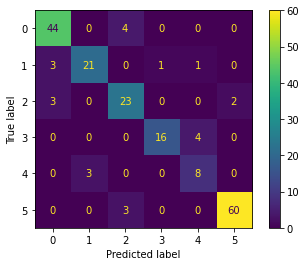

In [58]:
#Get a sense of where the model is working well or struggling.
block_predictions = confusion_matrix(y_test_labelled, rf_grid_search.predict(X_test))
disp = ConfusionMatrixDisplay(block_predictions)
disp.plot();

The model does well, though it struggles particularly with identifying Burnley-Moran (label 4). Burnley-Moran was well represented in our training set, so the model's challenges with this school suggest that perhaps its component blocks are especially heterogeneous compared to the blocks in other school zones.

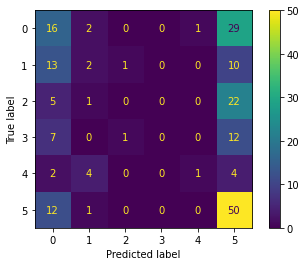

In [59]:
#Check the same for the race-only model
block_predictions_race = confusion_matrix(y_test_labelled, rf_race_grid_search.predict(race_test))
disp2 = ConfusionMatrixDisplay(block_predictions_race)
disp2.plot();

The race only model seems to almost exclusively predict Clark or Venable Elementary. Our dummy model always picked Venable, so it's not surprising that the two models have similar scores.

Socioeconomic factors are often blamed in conversations about educational equity, so I was curious to see what happened if I constructed a similar model but with only the non-racial demographic data.  This last model will look at all of our demographic data besides racial composition. Most of this data came from the Virginia Equity Center and was only available at the block group level, so less granularity might have an impact on how well the model works. That model performed almost as well as overall model, accurately predicting school zone in 85.7% of the testing data. 

In [60]:
other_demo = X.drop(race_features, axis=1)

In [61]:
other_demo

,HU_Occupied,hhincE,hsmoreE,bamoreE,gradmoreE,unempE,hlthinsE,pubinsE,allhseE,renter30E,homeownE,vacrateE,age17E,age24E,age64E,age65E,Density,SNAP_rate
0,148,21775.0,96.43,85.71,57.56,3.98,95.80,3.46,783,57.0,8.3,15.5,0.74,72.23,21.64,5.39,2.416667,62.892857
1,0,21775.0,96.43,85.71,57.56,3.98,95.80,3.46,783,57.0,8.3,15.5,0.74,72.23,21.64,5.39,0.000000,62.892857
2,2,21775.0,96.43,85.71,57.56,3.98,95.80,3.46,783,57.0,8.3,15.5,0.74,72.23,21.64,5.39,5.000000,62.892857
3,1,21775.0,96.43,85.71,57.56,3.98,95.80,3.46,783,57.0,8.3,15.5,0.74,72.23,21.64,5.39,2.000000,62.892857
4,0,21775.0,96.43,85.71,57.56,3.98,95.80,3.46,783,57.0,8.3,15.5,0.74,72.23,21.64,5.39,0.000000,62.892857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777,0,30139.0,91.69,47.61,25.69,4.11,93.76,6.54,478,62.2,3.3,12.3,0.00,69.79,24.58,5.63,0.000000,41.062500
778,18,19187.0,81.70,48.65,16.34,1.49,82.81,4.78,955,85.0,0.0,15.5,4.99,59.66,33.39,1.95,4.611111,11.234146
779,23,19187.0,81.70,48.65,16.34,1.49,82.81,4.78,955,85.0,0.0,15.5,4.99,59.66,33.39,1.95,4.478261,11.234146
780,437,19187.0,81.70,48.65,16.34,1.49,82.81,4.78,955,85.0,0.0,15.5,4.99,59.66,33.39,1.95,2.794183,11.234146


In [62]:
demo_train, demo_test, y_train, y_test = train_test_split(other_demo, y, test_size=.25, random_state=12)

# demo = Pipeline(steps=[('knn', KNNImputer()), ('scale', StandardScaler()), 
#                             ('rf', RandomForestClassifier())])

# params = {'rf__n_estimators': [30, 40, 50, 60], 
#                  'rf__max_depth': [12, 13, 14], 
#                  'rf__max_features': [4, 5, 6, 7, 8, 9]}

# tree_gs_demo = GridSearchCV(demo, params)
# tree_gs_demo.fit(demo_train, y_train_labelled).score(demo_train, y_train_labelled)

#Model with grid searched parameters
tree_grid_search_demo = Pipeline(steps=[('knn', KNNImputer()), ('scale', StandardScaler()), 
                            ('rf', RandomForestClassifier(max_depth=14, max_features=6, n_estimators=40))])
tree_grid_search_demo.fit(demo_train, y_train_labelled).score(demo_train, y_train_labelled)

0.9556313993174061

In [63]:
tree_grid_search_demo.score(demo_test, y_test_labelled)

0.8673469387755102

Just using non-race demographic information is almost as predictive as using all available features.

In [64]:
#Prepare data for a map visualization
data['preds'] = rf_grid_search.predict(X)
data['race_preds'] = rf_race_grid_search.predict(race)

school_labels = {0:"Clark", 1: 'Jackson-Via', 2: 'Johnson', 3: 'Greenbrier', 4: 'Burnley-Moran', 5: 'Venable'}
data = data.replace({'preds': school_labels})
data = data.replace({'race_preds': school_labels})

In [65]:
#Visualize the results. Clicking on any block shows the actual school zone and the zone predicted by both the full 
#and race-only models. The blocks that were close to evenly split between school zones are omitted and thus 
#have no color.

m2 = folium.Map(location=(38.034, -78.477), zoom_start=13)

folium.GeoJson(schools, style_function = lambda x: {"fillColor": 'red' if x['properties']['ZONE']=="Clark" 
else ('blue' if x['properties']['ZONE']=="Jackson-Via" 
else ('orange' if x['properties']['ZONE']=="Johnson" 
else ('yellow' if x['properties']['ZONE']=="Burnley-Moran"
else ('purple' if x['properties']['ZONE']=="Greenbrier" else 'green')))), "weight": 4, 
                                                                         "color": "black", 'fill_opacity':1, 
                                                                         'fill':True}).add_to(m2)

popup = GeoJsonPopup(
    fields=['school_zone', 'preds', 'race_preds'],
    aliases=["School Zone:", 'Predicted School Zone:', "Predicted School Zone, Racial Demographics Only:"],
    localize=True,
    labels=True,
    style="background-color: yellow;"
)
folium.GeoJson(data,
    style_function=lambda feature: {
        'weight':1,
        "color": "blue",
        'fill_opacity':0
    }, popup=popup
).add_to(m2)


m2

## Conclusion
This model does not serve an immediately practical purpose, and it was never intended to. If someone wants to know their school district, the city schools division offers an address lookup tool that is always right.

Instead, this model is intended to spark continued conversation. It appears that the school district has largely succeeded in drawing a map that is no longer explicitly racist. The map does still reflect a city dramatically divided by economic factors. These are not issues likely to be solved by redrawing the map, as they reflect the geography of housing in the city. If truly heterogenous schools were the ultimate goal, then students would have to travel all over town at random rather than attending their closest school. In addition to being a logistical nightmare, such a solution would surely be intolerable to the community.

The takeaway from this project is that the school map is no longer the place to direct our efforts towards increasing equity. School zoning was merely the first line of attack in efforts to tacitly keep schools segregated. While this project suggests that particular obstacle has been removed, the NYTimes article outlines many other areas of persistent discrimination, including access to advanced courses, gifted education, and a two-tiered diploma system. The public school system is no longer assigning students to schools in a directly racist way, but there's plenty of work still to be done.